In [1]:
from IPython.display import Image

# Intro
[
* **NO JUPYTER NOTEBOOK STARTED**,
* **MATRIX ENVIRONMENT NOT ACTIVATED YET**,
* **XOURNAL STARTED AND READY**
]


* In this lecture, some of you might come in touch with plotting for the first time. At least it's the first time in this bootcamp, that you come in contact with anything related to data visualization.
* **[Show Schedule]** First data project is more about **data cleaning**, you don't necessarily need plotting. But in case you feel the need, this today's lecture will give you tools, with which you can create your first visualisations

* So when it comes to plotting with Python, and with plotting, in 95% of cases what is meant, is MATPLOTLIB there's one key thing, that we have to understand pretty early, because a lot of people learning plotting in Python miss this aspect and struggle a lot. And this key thing is: **understanding the datastructures**, that you're having in front of you.
    * Same with **any new library** you learn: Get a solid understanding about what are the key data structures, how you use them, what functions to they have - and you're half done

* We're starting today with **MATPLOTLIB**, which is the most basic plotting library in Python. Matplotlib:
    * extremely **versatile, flexible**
    * but therefore extremely **complex**
    * you can customize every tiny bit of your graph and your diagram, if you only know how to do it. And to understand that, it is necessary to understand the **DATA STRUCTURES** we're dealing with in Matplotlib.
    
(*Sort of a general rule, if you're working in a company and you're told, "here - use this new Python library" - if you focus on getting accustomed to the most important data structures of that library and what they're capable of, you're on a good way mastering it*)

**Data structures known so far [LET THEM GUESS]**
* Primitives in **Python** (`float`, `int` `str` `booleans`+ containers(`lists` `dicts` `tuples` `sets`)
* Pandas: `DataFrame`, index-objects (applied to cols & rows), Series
* SQL: tables (tabular data) 

Today, 2 new datastructures we need to understand to be able to plot with matplotlib: FIGURE, AXES

[**DRAW**]

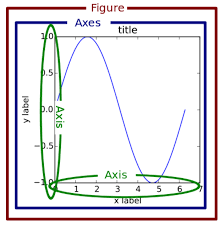

In [2]:
Image("graph_anatomy.png", width=300)

Basic ingredient for a matplotlib-plot are the datastructures:
* **FIGURE** ("canvas", "frame of a painting", without it, you paint on your table)
* **AXES** (also subplot, "Ink on the canvas")
Without one of these, you can't plot

two more objects: Each **AXES** object has a **x_axis** and a **y_axis** object

REMARKS:
* you can have 2 x_axis or 2 y_axis
* you can plot multiple plots on one figure. In the object terminology: Attaching multiple axis objects to a figure object, or putting them into the figure object (because fig  is a container)
* you can plot as many plots into a figure as you want [**DRAW at BOARD**], e.g. Axes[0] : lineplot, Axes[1]: barplot, Axes[3]: scatterplot, Axes[4]: piechart

# 1. Plotting in matplotlib

### 1.0. Install `matplotlib` into your conda environment.

[***OPEN TERMINAL***]
We put on our backpack, like we do every day

```conda activate matrix```

Magically I have the exact same backpack like Emily.
And we put something new in it: Matplotlib. How do we install something,
well, you can always give a try to 

```conda install matplotlib```

doesn't work,[**ASK WHAT TO DO NOW**].... [***GOOGLE***], website `anaconda.org` should have it:

```conda install -c anaconda matplotlib```

```jupyter notebook```

### 1.1. Plotting (single plot)

In [3]:
import matplotlib
import matplotlib.pyplot as plt

**What is pyplot**?
* matplotlib is now 17 years old, and over the course of time, it **grew really really complex**, with a lot of possibilities to manipulate a graph

* we mentioned: **you have to translate every change you want to make into code**

* let's say if you had a scatterplot with several observations, and you wanted to add some new observations to it, or you wanted to change to a barplot ... before pyplot, you had to make changes to all the matplotlib objects manually.

* So people came up with the idea... "If I wanted to make changes to my graph, let matplotlib do the work and change those objects automatically".

* So **pyplot** is some sort of layer on top of the basic matplot lib functions, that makes your **life a lot more easier** by doing some **repetitive work** for you. Imagine it like all those **fancy electronic assistance systems in a car** (like Traction control system - 'Antischlupfregelung' in German)

In [4]:
import pandas as pd
import numpy as np

In [5]:
%matplotlib inline

What does % mean? Notebook magics = useful utilities. They are some sort of useful helpers that make using Jupyter notebook easier. We won't go into that, google them yourself just a short example

In [6]:
%timeit [x**2 for x in range(10)]

2.37 µs ± 182 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [7]:
%magic

What `%matplotlib inline` does: It outputs the plots directly into notebook

### Now, let's finally plot

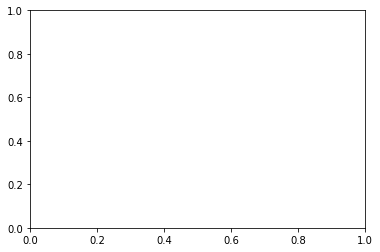

In [8]:
# How to initialize the two essential objects for plotting:
fig, ax = plt.subplots()

We created us a **figure** object, and an **axes** object, but with no data yet

In [9]:
print(type(fig))
print(type(ax))

<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


Let's fill it with data some random data

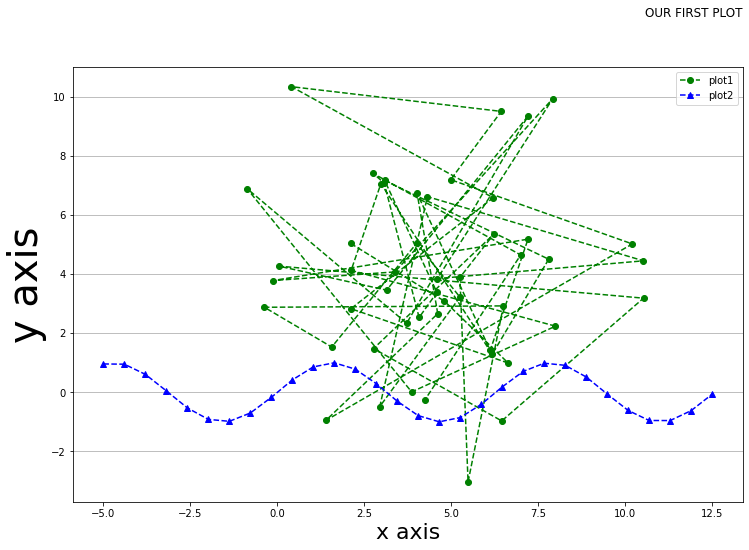

In [10]:
import random

y1 = np.random.normal(loc=5, scale=3, size=50)
x1 = np.random.normal(loc=5, scale=3, size=50)

x2 = np.linspace(-5, 12.5, 30)
y2 = np.sin(x2)

fig, ax = plt.subplots(figsize=(12,8))
ax.plot(x1,
        y1,
       color='green',
       marker='o',
       linestyle='dashed',
       label='plot1',
       )
ax.plot(x2,
        y2,
        color='blue',
        marker='^',
        linestyle='--',
       label='plot2',
       )

ax.set_xlabel('x axis', fontsize=22);
ax.set_ylabel('y axis', fontsize=40);
ax.set_title('OUR FIRST PLOT', loc='right', pad=50);
ax.grid(axis='y')
ax.legend()

### 1.2. Now multiple plots

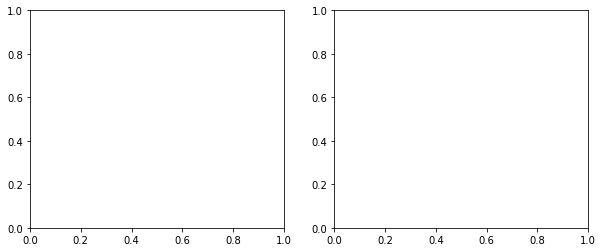

In [11]:
fig, ax_m = plt.subplots(figsize=(10,4), nrows=1, ncols=2)

**[QUESTION]** What happened? No data? Why not?

what is `ax_m` now? let's see:

In [12]:
type(ax_m)

numpy.ndarray

In [13]:
ax_m

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f60c2747430>,
      dtype=object)

So by telling pyplot, execute this subplots function here with those two arguments **nrows**, **ncols** it automatically creates us the corresponding number of axes objects and we can assign it by tuple unpacking, and then later fill it with data.

How big would this `ax_m` object be? [DONT EXECUTE YET]

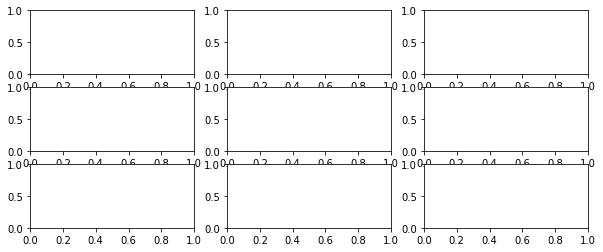

In [14]:
fig, ax_m = plt.subplots(figsize=(10,4), nrows=3, ncols=3)

What does axes object look like right now? Let's check

In [15]:
ax_m

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f60c26d7e80>,
      dtype=object)

3x3 nested array of Subplot objects!

How do we batch-wise fill them or decorate them? **[ASK CLASS?]**
* we can't loop through it easily because it's nested!
* what we can do....

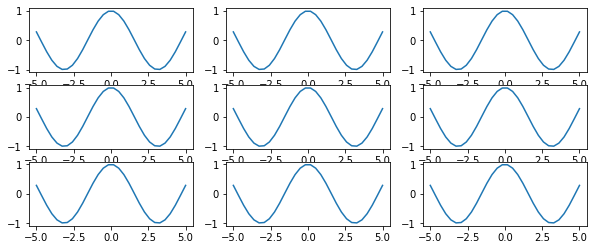

In [16]:
x = np.linspace(-5, 5, 30)

#colors = ['red', 'blue', 'yellow', 'black', 'brown', 'white', 'cyan', 'green', 'violet']

#i=0
for ax in ax_m.flat:
    ax.plot(x,
            np.cos(x),
            #color=colors[i],
           )
    #i+=1
fig

**[CAN BE SKIPPED]**
Now let's go back to our 1x2 figure

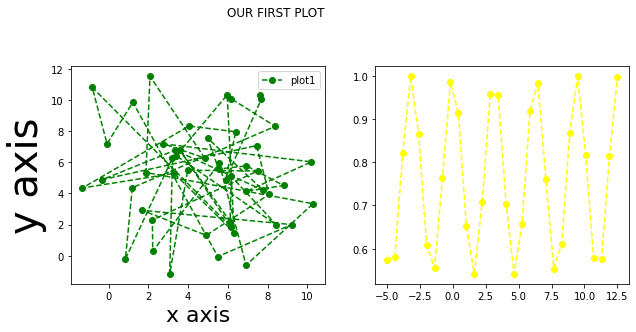

In [17]:
fig, ax_m = plt.subplots(figsize=(10,4), nrows=1, ncols=2)

y1 = np.random.normal(loc=5, scale=3, size=50)
x1 = np.random.normal(loc=5, scale=3, size=50)

x2 = np.linspace(-5, 12.5, 30)
y2 = np.cos(y2)

ax_m[0].plot(x1,
        y1,
       color='green',
       marker='o',
       linestyle='dashed',
       label='plot1')
ax_m[0].set_xlabel('x axis', fontsize=22);
ax_m[0].set_ylabel('y axis', fontsize=40);
ax_m[0].set_title('OUR FIRST PLOT', loc='right', pad=50);
ax_m[0].legend()

## Second plot



ax_m[1].plot(x2,
        y2,
       color='yellow',
       marker='o',
       linestyle='dashed',
       label='plot1')


# 2. Plotting with Pandas data using pandas built-in plotting

* So far we used **pure numpy data objects** as inputs for our plot function, which we executed on an axis object
* what if we have Pandas Dataframes?
* turns out... matplotlib and Pandas work really well together, so lets take a pandas dataframe...

In [18]:
df = pd.DataFrame({'x':[1,2,3,4,5,6,7,8],
                   'y':[2,4,5,7,8,9,11,14]},
                  index=[x for x in range(8)]
                 )

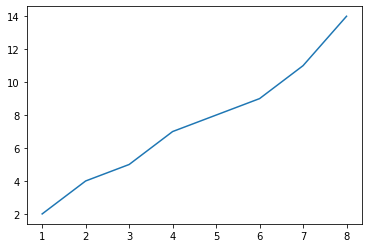

In [19]:
fig, ax = plt.subplots()
ax.plot(df['x'], df['y'])

# Style as you like

You don't even need to create fig, ax objects with that command, you can just say.... quick & dirty

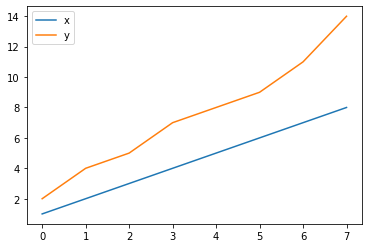

In [20]:
df.plot()

Beware, in this case, it treats every column as y-values for a separate graph and assumes a running index as x-value for every graph, so you get two graphs!
How do we get only one?

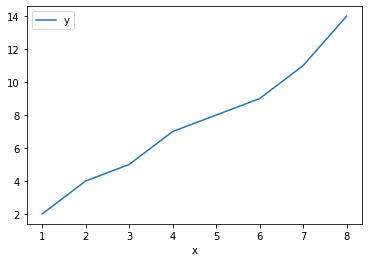

In [21]:
df.plot(x='x',
        y='y',
       )

So we mentioned, we need an axis and a fig object.
* Does that mean, in this case, we don't need it?
**NO**
* Look at the output!

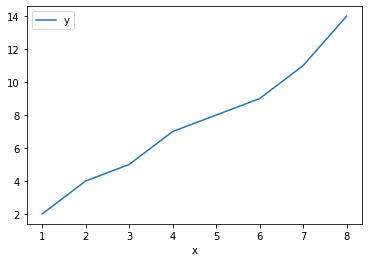

In [22]:
ax = df.plot(x='x',
             y='y',
            )

In [23]:
type(ax)

matplotlib.axes._subplots.AxesSubplot

how do we get the figure which is associated whith this axis object?

**[SHOW dir(ax)]**

In [24]:
fig = ax.get_figure()

Now we can manipulate the figure

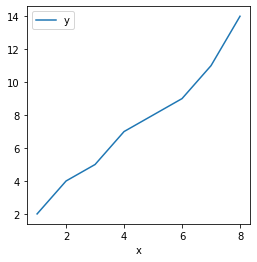

In [25]:
fig.set_figwidth(4)
fig.set_figheight(4)

fig

### Pandas built-in plots has more **kinds**

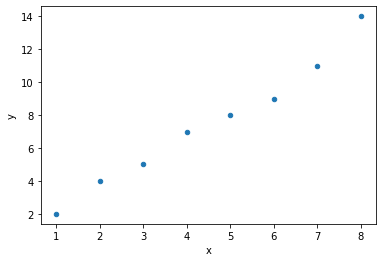

In [26]:
df.plot(x='x',
        y='y',
        kind='scatter')

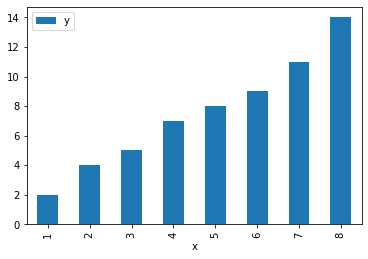

In [27]:
df.plot(x='x',
        y='y',
       kind='bar')

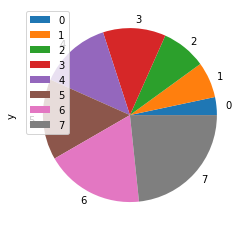

In [28]:
df.plot(x='x',
        y='y',
       kind='pie')

### Demonstrate zoom in & plot needing an ax-association

Let's cheat a bit and get us some more data from real datasets and import...

In [29]:
from pydataset import data

In [30]:
pydata_df = data()

In [31]:
pydata_df.head()

,dataset_id,title
0,AirPassengers,Monthly Airline Passenger Numbers 1949-1960
1,BJsales,Sales Data with Leading Indicator
2,BOD,Biochemical Oxygen Demand
3,Formaldehyde,Determination of Formaldehyde
4,HairEyeColor,Hair and Eye Color of Statistics Students


In [32]:
df_co2 = data('co2')

In [33]:
df_co2.head()

,time,co2
1,1959.000000,315.42
2,1959.083333,316.31
3,1959.166667,316.50
4,1959.250000,317.56
5,1959.333333,318.13


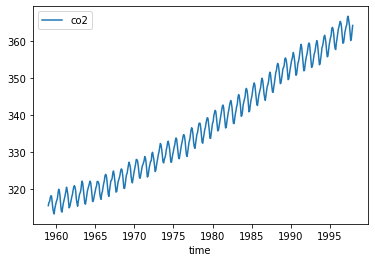

In [34]:
df_co2.plot(x='time', y='co2')

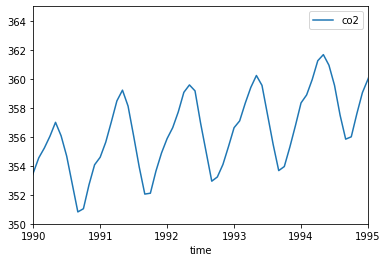

In [35]:
# How to zoom in?

df_co2.plot(x='time',
            y='co2',
            xlim=(1990, 1995),
            ylim=(350,365),
           )

What if we want to make that plot bigger? **[THINK FOR 10 seconds]**

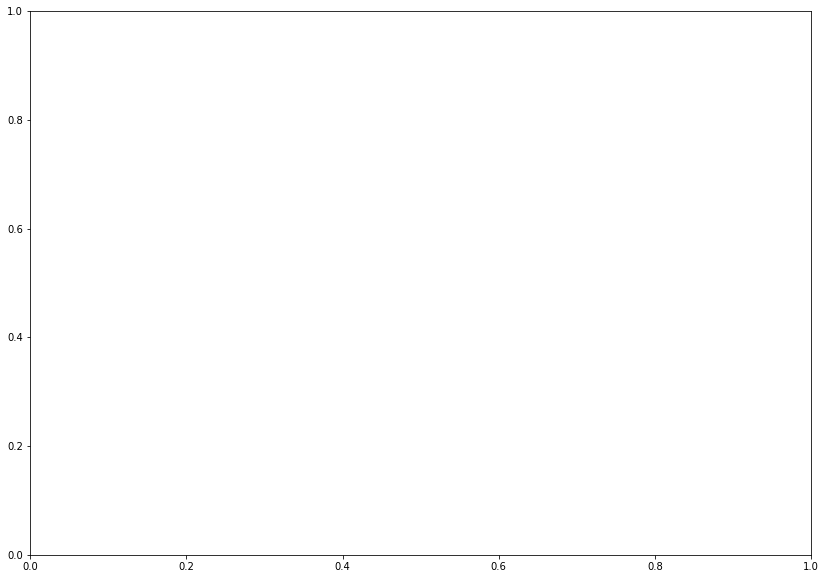

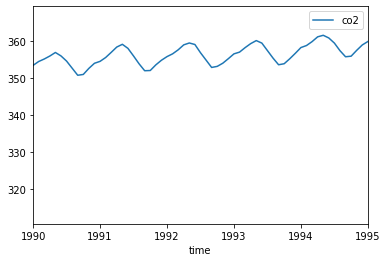

In [36]:
# setting limits / zooming in
fig, ax1 = plt.subplots(figsize=(14,10))

df_co2.plot(x='time',
            y='co2',
            xlim=(1990, 1995),
            
            # introduce this line to show effect of
            # attaching axes objects
            #ax=ax1
           )

So what's a good way to plot with matplotlib?
* [GO TO MATPLOTLIB.ORG,]
* [show GALLERY]
* [show matplotlib.axes API]

### KEY TAKEAWAYS so far:

* plots in matplotlib are built on a figure and an axes object, you need both!
* pyplot is a layer on top of matplotlib that makes plotting more comfortable
* manipulating the **properties** -> **axis object**
* manipulating the **size of the plot** -> **figure object**
* manipulating a **multidimensional axes** object... **flatten** it first
* you can make use of **pandas dataframe columns** (Series) and plot them in a pyplot plot
* or use **pandas built-in plot function** for quick plotting-> easily switch between kinds of plots
* Make sure, your dataframe plots **always are attached to an axes object** / your plots know, which axes object they should attach to

# *** BREAK ***

# A few words on plotting workflow

**[DRAW DIAGRAM]**
1. First think about the aspect that you want to visualize, the point you want to make. Think **hypothesis driven**
2. from raw data you first have to combine them. Compare: Kata with movie ID's use `.merge` (JOIN in SQL), `filter`.
3. restructure your data accordingly. Using `.groupby`, `.agg`, `.pivot`, `.melt`, to aggregate the data according to your needs
4. Plot. Ideally after step 2, a column of your aggregated 

### A short example

In [37]:
from pydataset import data

In [38]:
df_ti = data('titanic')

In [39]:
df_ti

,class,age,sex,survived
1,1st class,adults,man,yes
2,1st class,adults,man,yes
3,1st class,adults,man,yes
4,1st class,adults,man,yes
5,1st class,adults,man,yes
...,...,...,...,...
1312,3rd class,child,women,no
1313,3rd class,child,women,no
1314,3rd class,child,women,no
1315,3rd class,child,women,no


In [40]:
df_ti['class'].unique()

array(['1st class', '2nd class', '3rd class'], dtype=object)

What I want to display: Sum of passengers for each class on the titanic

[DRAW, OR MAKE A MARKDOWN TABLE **THINK ABOUT IT FOR 10 SECONDS**]

In [41]:
df_ti_with_ones = df_ti.assign(count=1)
df_ti_count = df_ti_with_ones.groupby('class').agg({'count':'sum'})

In [42]:
df_ti_count = df_ti_count.reset_index()

In [43]:
df_ti_count

,class,count
0,1st class,325
1,2nd class,285
2,3rd class,706


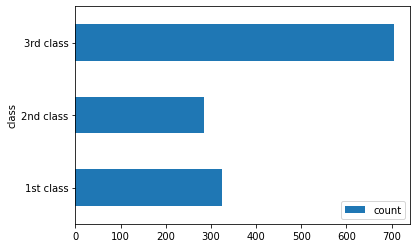

In [44]:
df_ti_count.plot(kind='barh',
                x='class',
                y='count',
                #color=['b', 'g', 'r']
                )

# 3. Plotting in seaborn

**Seaborn**
* different plotting library, **strong with statistics**
* built **on top of  matplotlib** (running matplotlib under the hood)
* works even better with pandas dataframes

`conda install -c anaconda seaborn`

`https://seaborn.pydata.org/`

In [45]:
df_ti

,class,age,sex,survived
1,1st class,adults,man,yes
2,1st class,adults,man,yes
3,1st class,adults,man,yes
4,1st class,adults,man,yes
5,1st class,adults,man,yes
...,...,...,...,...
1312,3rd class,child,women,no
1313,3rd class,child,women,no
1314,3rd class,child,women,no
1315,3rd class,child,women,no


**[GOOGLE 'seaborn gallery']**
* General approach for plotting - check the gallery, what plot do I want, check the code

#### Let's reproduce that plot from above with the Titanic passengers

In [46]:
df_ti_count

,class,count
0,1st class,325
1,2nd class,285
2,3rd class,706


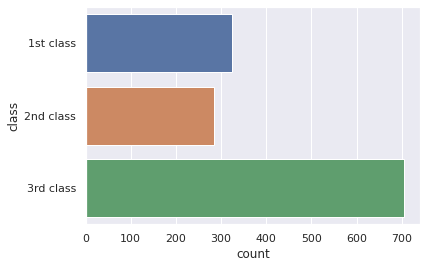

In [47]:
import seaborn as sns
sns.set(style="darkgrid")
       
sns.barplot(data=df_ti_count,
            y='class',
            x='count',
            orient='h',
           )

* **[EXPLAIN interface a litte, pretty easy]**
* **[GOOGLE seaborn gallery. Explain hot to pick plots, copy paste, change those settings according to your needs]**

Let's take a famous dataset, that you might come across when learning pandas:

In [48]:
df_tips = data('tips')

**[SHOW AND EXPLAIN DATASET]**

In [49]:
df_tips.head()

,total_bill,tip,sex,smoker,day,time,size
1,16.99,1.01,Female,No,Sun,Dinner,2
2,10.34,1.66,Male,No,Sun,Dinner,3
3,21.01,3.50,Male,No,Sun,Dinner,3
4,23.68,3.31,Male,No,Sun,Dinner,2
5,24.59,3.61,Female,No,Sun,Dinner,4


* categorical data (`sex`, `smoker`, `day`)
* numerical data (`total_bill`, `tip`)

#### Scatterplot

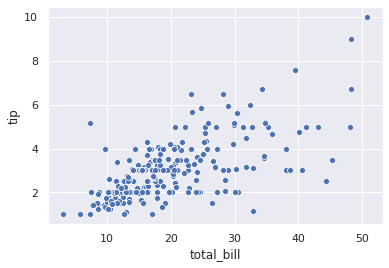

In [50]:
sns.scatterplot(data=df_tips,
               x='total_bill',
               y='tip'
               )

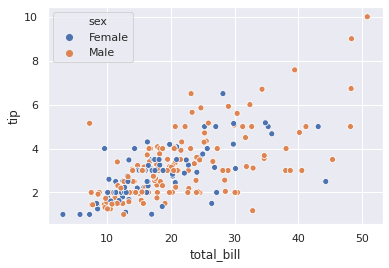

In [51]:
sns.scatterplot(data=df_tips,
               x='total_bill',
               y='tip',
                hue='sex'
               )

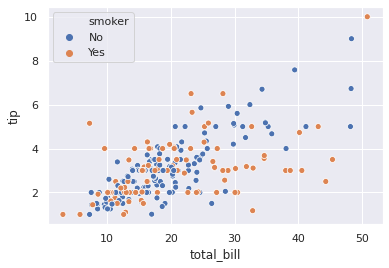

In [52]:
sns.scatterplot(data=df_tips,
               x='total_bill',
               y='tip',
                hue='smoker',
               )

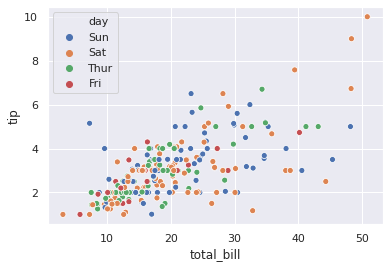

In [53]:
sns.scatterplot(data=df_tips,
               x='total_bill',
               y='tip',
                hue='day'
               )

In [54]:
df_tips['day'].unique()

array(['Sun', 'Sat', 'Thur', 'Fri'], dtype=object)

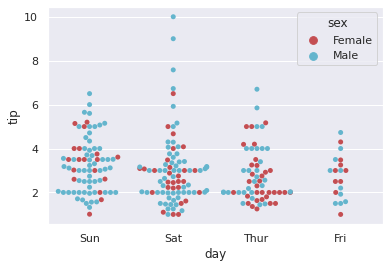

In [55]:
sns.swarmplot(data=df_tips,
              x="day",
              y="tip",
              hue="sex",
              palette=["r", "c", "y"],
             )

#### A statistically more meaningful plot: Boxplot

[**SHOW BOXPLOT EXPLANATION PICTURE**]

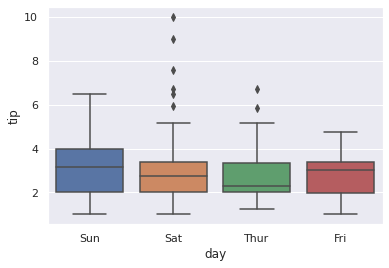

In [56]:
sns.boxplot(x='day',
            y='tip',
            #hue='sex',
            data=df_tips
           )

### Barplot (danger: sns.barplot shows mean, if you don't want that: sns.countplot)

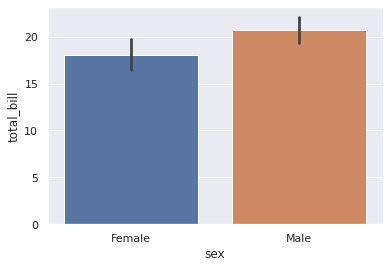

In [57]:
sns.barplot(data=df_tips,
            x='sex',
            y='total_bill',
            #estimator=np.std,
           )

In [58]:
df_tips[df_tips['sex']=='Female']['total_bill'].std()

8.009208988951961

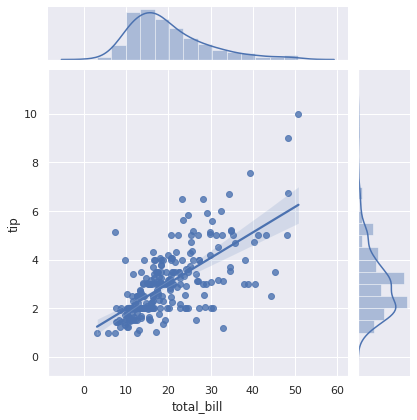

In [59]:
sns.jointplot(data=df_tips,
              x='total_bill',
              y='tip',
              kind='reg',
              #kind='kde'
             )

### Pairplot (good for getting a general overview of data)

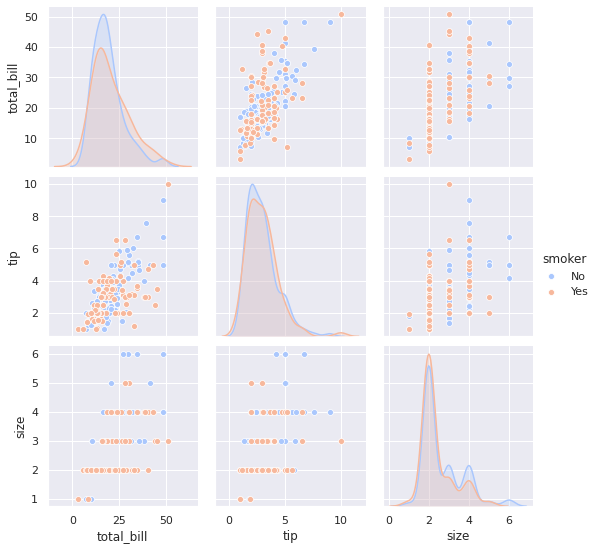

In [60]:
# Plots pairwise relationships in a dataset
# [eventually EXPLAIN IN DRAWING]
sns.pairplot(df_tips,
            hue='smoker',
            palette='coolwarm',
            )

### Swarmplot and boxplot in one

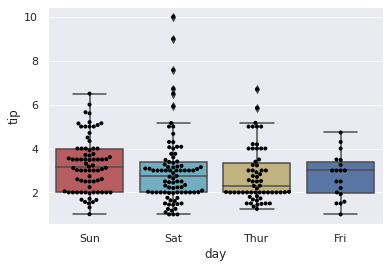

In [61]:
sns.swarmplot(data=df_tips,
              x="day",
              y="tip",
              #hue="sex",
              #palette=["r", "c", "y"],
              color='black',
              linewidth=1,
              size=3
             )
sns.boxplot(x='day',
            y='tip',
            #hue='sex',
            data=df_tips,
            palette=["r", "c", "y", 'b']
           )

### Histogram

Text(0, 0.5, 'Amount ($)')

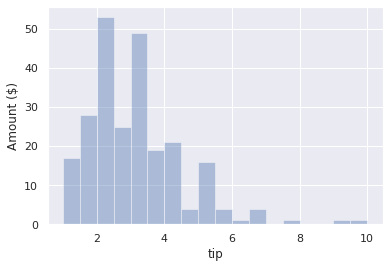

In [62]:
fig, ax = plt.subplots()

ax = sns.distplot(df_tips['tip'],
                  kde=False,
                 )
ax.set_ylabel('Amount ($)')

**[RECAP]**

# [BREAK]

optional:

 # 3. PLOTLY
 
 * show plotly [GOOGLE PLOTLY, COPY PASTE A PLOT]
 * Create web based, interactive visualizations
 * therefore makes use of JavaScript
 * can be used in Jupyter Notebook
 
 * `https://plotly.com/python/basic-charts/`
 
 * `conda install -c plotly

In [63]:
import plotly.graph_objects as go
import numpy as np

N = 100000
fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(N),
    y = np.random.randn(N),
    mode='markers',
    marker=dict(
        color=np.random.randn(N),
        colorscale='Viridis',
        line_width=1,
    )
))

fig.show()

In [64]:
type(fig)

plotly.graph_objs._figure.Figure

# 4. BOKEH